In [1]:
using NCDatasets
using CairoMakie
using Printf
using Interpolations
using Dierckx
using Statistics

In [ ]:
ds_gmix = NCDataset("/work/hdd/bfxn/ikeshwani/HorizontalConvection/output/GPU/GRC/RA1e8/4x_stretch/512_128/G_mix_t194.nc")


Dataset: /work/hdd/bfxn/ikeshwani/HorizontalConvection/output/GPU/GRC/RA1e8/4x_stretch/512_128/G_mix_t194.nc
Group: /

Dimensions
   b = 498
   time = 1948

Variables
  b_out   (498)
    Datatype:    Float64 (Float64)
    Dimensions:  b
    Attributes:
     long_name            = buoyancy bin centers

  time   (1948)
    Datatype:    Float64 (Float64)
    Dimensions:  time
    Attributes:
     long_name            = time

  G_mix   (498 × 1948)
    Datatype:    Float32 (Float32)
    Dimensions:  b × time
    Attributes:
     long_name            = mixing distribution G_mix

Global attributes
  source_file          = combined_t194.nc
  RA                   = 1e8


In [2]:
ds_psi = NCDataset("/work/hdd/bfxn/ikeshwani/HorizontalConvection/output/GPU/GRC/RA1e8/4x_stretch/512_128/psi_b_t194.nc")
ψ_b = ds_psi["ψ_b"]
b_out = ds_psi["b_out"]
x = ds_psi["x"]

x (512)
  Datatype:    Float64 (Float64)
  Dimensions:  x
  Attributes:
   long_name            = x position


In [15]:
b_out

100-element Vector{Float64}:
 -0.9519274830818176
 -0.9324036836624146
 -0.9128798246383667
 -0.8933560252189636
 -0.8738322257995605
 -0.8543083667755127
 -0.8347845673561096
 -0.8152607679367065
 -0.7957369089126587
 -0.7762131094932556
 -0.7566893100738525
 -0.7371654510498047
 -0.7176416516304016
  ⋮
  0.7661686539649963
  0.7856925129890442
  0.8052163124084473
  0.8247401118278503
  0.8442639708518982
  0.8637877702713013
  0.8833115696907043
  0.9028354287147522
  0.9223592281341553
  0.9418830275535583
  0.9614068865776062
  0.9809306859970093

In [3]:
b_out = Array(b_out)[:]
x = Array(x)[:]
psi_b = Array(ψ_b)[:,:,3]

512×100 Matrix{Float32}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …   0.0           0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     -1.77636f-15  -1.77636f-15
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      3.55271f-15   3.55271f-15
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0           0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     -7.10543f-15  -7.10543f-15
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …   1.42109f-14   1.42109f-14
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     -1.06581f-14  -1.06581f-14
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0           0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      7.10543f-15   7.10543f-15
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      1.42109f-14   1.42109f-14
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …   0.0           0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      2.84217f-14   2.84217f-14
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     -7.10543f-15  -7.10543f-15
 ⋮                 

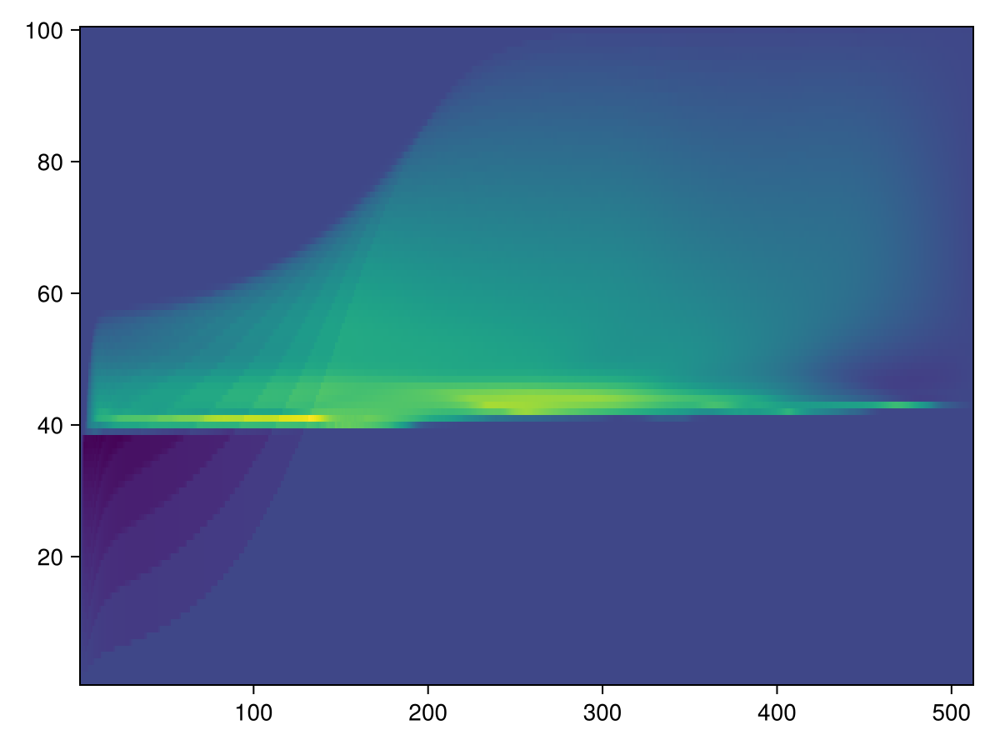

In [6]:
psiMean= mean(Array(ψ_b)[:,:,end-100:end], dims=3);

heatmap(psiMean[:, :, 1])

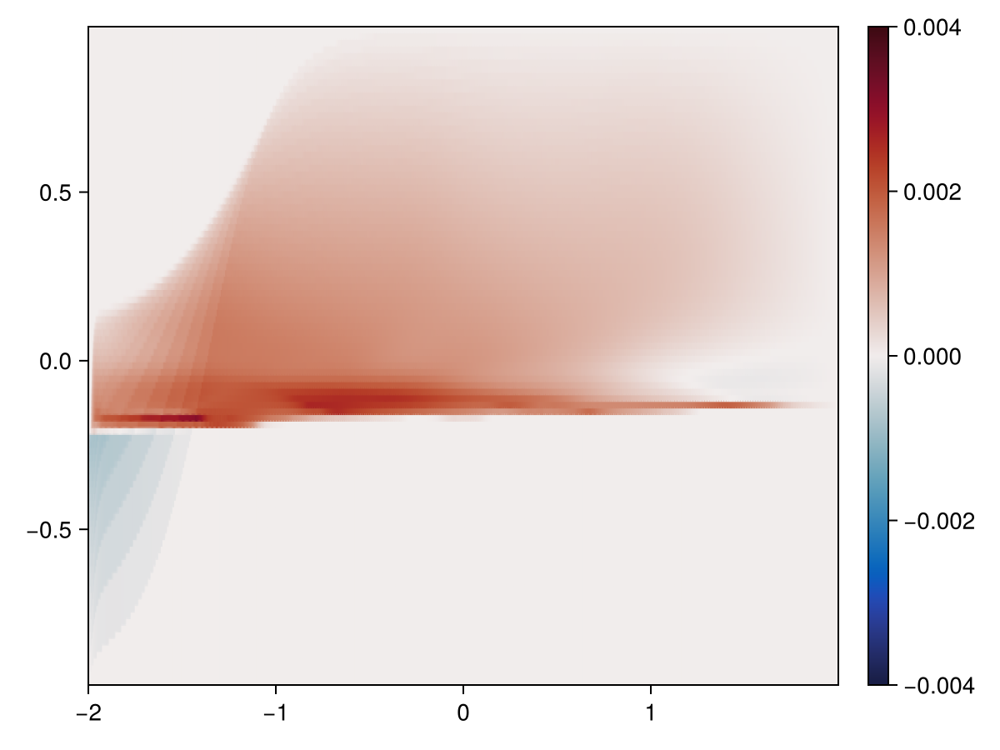

In [14]:
fig = Figure()
ax = Axis(fig[1,1])
hm = heatmap!(ax, Array(x)[:], Array(b_out)[:], psiMean[:, :, 1], colormap=:balance, colorrange=(-0.004, 0.004))
Colorbar(fig[1,2], hm)

fig

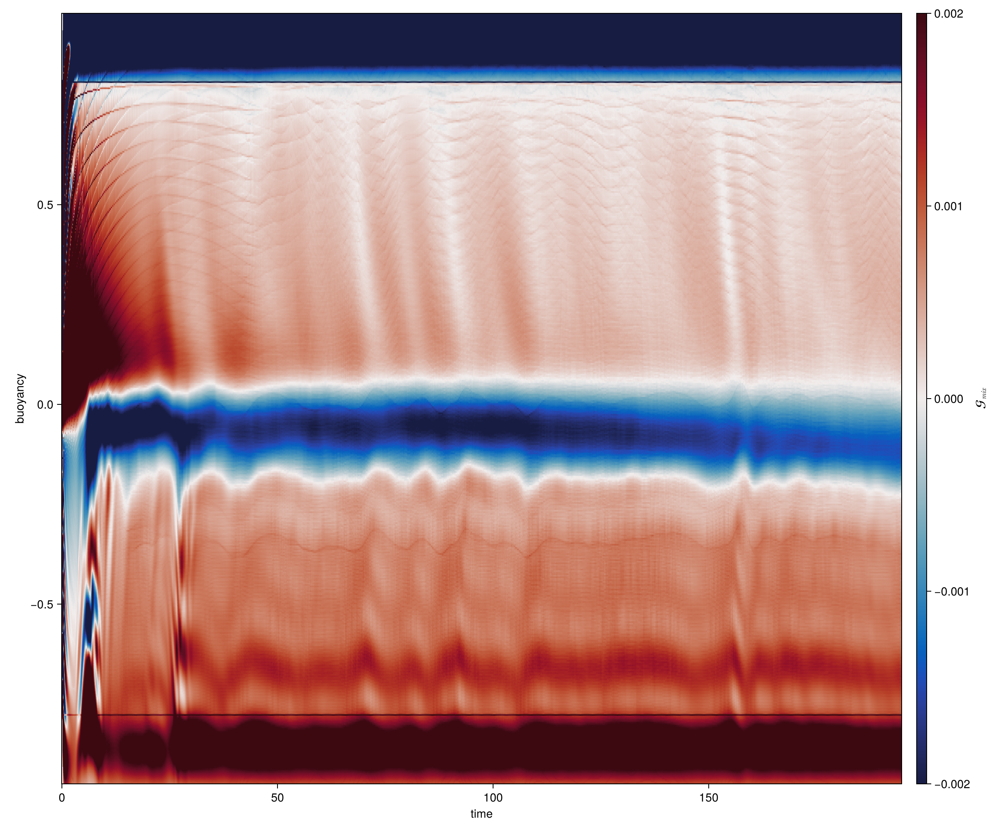

In [ ]:
Gmix = ds_gmix["G_mix"][:, :];
b_out = ds_gmix["b_out"][:]
t = ds_gmix["time"][:]

fig = Figure(size=(1200, 1000))
ax = Axis(fig[1,1], xlabel = "time", ylabel = "buoyancy")
hm = heatmap!(ax, t, b_out, Gmix', colormap=:balance, colorrange=(-0.002, 0.002))
Colorbar(fig[1,2], hm, label = L"\mathcal{G}_{mix}")

In [2]:
ds = NCDataset("/work/hdd/bfxn/ikeshwani/HorizontalConvection/output/GPU/GRC/RA1e8/4x_stretch/512_128/combined_t385.nc")
#ds_o = NCDataset("/work/hdd/bfxn/ikeshwani/HorizontalConvection/output/GPU/GRC/RA1e8/4x_stretch/512_128/oceanostics_seg5.nc")
b = ds["b"]
#χ = ds["chi"]

b (512 × 32 × 128 × 3648)
  Datatype:    Float32 (Float32)
  Dimensions:  x × y × z × time


In [3]:
b_init = Array(b)[:, 1, :, 3000];
wet = b_init .!= 0
b_init[.!wet] .= NaN
wet_mask = Float16.(copy(wet))
wet_mask[wet] .= NaN;

: 

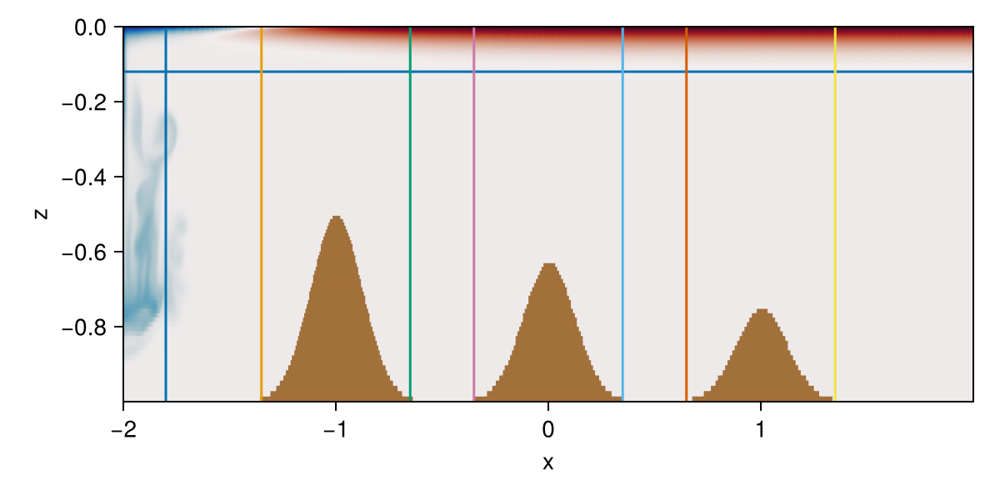

In [25]:
x = ds["x_caa"][:]
z = ds["z_aac"][:]

fig = Figure(size=(600, 300))
ax = Axis(fig[1,1], xlabel="x", ylabel="z")
heatmap!(ax, x, z, wet_mask, colormap=:turbid)
heatmap!(ax, x, z, b_init, colormap=:balance)
hlines!(ax, [-0.12])
vlines!(ax, [-1.8])
vlines!(ax, [-1.35])
vlines!(ax, [-0.65])
vlines!(ax, [-0.35])
vlines!(ax, [0.35])
vlines!(ax, [0.65])
vlines!(ax, [1.35])

fig

In [35]:
zBL = round(ds.attrib["Lx"] * (1e8)^(-1/5); digits=2) + 0.02

0.12000000000000001

In [37]:
function Gmix_by_region_masks(b, χ, ΔV, ΔA, region_masks, b_range, n_b_bins=500)
    results = []
    for (name, mask) in region_masks
        χ_masked = copy(χ)
        ΔV_masked = copy(ΔV)

        χ_masked[.!mask] .= 0
        ΔV_masked[.!mask] .= 0 

        b_out, G = G_mix_calc(
            copy(b), 
            χ_masked,
            ΔV_masked, 
            b_range=b_range, 
            n_b_bins = n_b_bins
        )

        A_region = sum(ΔA[mask])
        
        push!(
            results, 
            (region = name, 
            b = b_bout, 
            Gmix = G, 
            area = A_region. 
            Gmix_density = G / A_region)
        )
    end

    return results
end


Gmix_by_region_masks (generic function with 2 methods)

In [ ]:
round(ds.attrib["Lx"] * (1e8)^(-1/5))
region_masks = [

    ("plume", 
    X .< -1.8), 

    ("boundary_layer", 
    (Z .> zBL) .& (X .>= -1.8)), 

    ("basin0", 
    (X .>= -1.8) .& (X .< -1.35) .& (Z .<= zBL)), 

    ("hill1", 
    (X .>= -1.35) .& (X .< -0.65) .& (Z .< zBL)), 

    ("basin1", 
    (X .>= -0.65) .& (X .< -0.35) .& (Z .< zBL)), 

    ("hill2", 
    (X .>= -0.35) .& (X .< 0.35) .& (Z .< zBL)), 

    ("basin2", 
    (X .>= 0.35) .& (X .< 0.65) .& (Z .< zBL)), 

    ("hill3", 
    (X .>= 0.65) .& (X .< 1.35) .& (Z .<= zBL)), 

    ("basin3", 
    (X .>= 1.35) .& (Z .<= zBL))
]

In [3]:
x = ds["x_caa"][:]
y = ds["y_aca"][:]
z = ds["z_aac"][:]

Nx, Ny, Nz = ds.attrib["Nx"], ds.attrib["Ny"], ds.attrib["Nz"]

Δx = reshape(ds["Δx_caa"][:], Nx, 1, 1)
Δy = reshape(ds["Δy_aca"][:], 1, Ny, 1)
Δz = reshape(ds["Δz_aac"][:], 1, 1, Nz)

ΔV = Δx .* Δy .* Δz;

In [4]:
# Simple Gaussian smoother (no extra packages needed)
function gaussian_smooth(x::Vector, σ::Real)
    n      = length(x)
    kernel_half = ceil(Int, 3σ)
    out    = similar(x, Float64)
    for i in 1:n
        wsum = 0.0; vsum = 0.0
        for j in max(1,i-kernel_half):min(n,i+kernel_half)
            w     = exp(-0.5*((i-j)/σ)^2)
            wsum += w
            vsum += w * x[j]
        end
        out[i] = vsum / wsum
    end
    return out
end

gaussian_smooth (generic function with 1 method)

In [ ]:
b_init = b[:, :, :, 100]
χ_init = χ[:, :, :, 100]
b_range = (minimum(b), maximum(b))
n_b_bins=500

N_cells = length(b_init)                      # works on a single time snapshot
ΔV_flat = reshape(ΔV, N_cells)
b_flat = reshape(b_init, N_cells)
χ_flat = reshape(χ_init, N_cells)

#sort everything by buoyancy value
sort_idx = sortperm(b_flat)
b_sort = b_flat[sort_idx]
χdV_sort = χ_flat[sort_idx] .* ΔV_flat[sort_idx]

#cumsum function of buoyancy, sampled at every cell's buoyancy
F_sort  = cumsum(χdV_sort)

#bin χdV onto uniform grid before cumsum
b_min, b_max = b_range
b_uniform = range(b_min, b_max; length=n_b_bins)
Δb = step(b_uniform)

χdV_cumbinned = cumsum(χdV_binned)
dχdV_db = diff(χdV_cumbinned) ./ Δb #first derivative of binned χdV
b_out = collect(b_uniform[1:end-1]) .+ Δb/2

Gmix = 0.5 .* dχdV_db ./ Δb

499-element Vector{Float64}:
 0.00031299985571862915
 0.0007286268027231547
 0.0009097401576964794
 0.0018593234177433535
 0.0013344714341365373
 0.003347965780578004
 0.0034004482238789296
 0.0043261785665660284
 0.006572580107106672
 0.00840194770189771
 0.010431683623790463
 0.015904611448561094
 0.017327482921877562
 ⋮
 0.13414403209237946
 0.1911732332874522
 0.2658341679095039
 0.602010121896341
 3.802475148841131
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [ ]:
b_init = b[:, :, :, 100]
χ_init = χ[:, :, :, 100]
b_range = (minimum(b), maximum(b))
n_b_bins=500

b0 = -0.3
#also 
#do this in a for loop iterating through all bs so that the Mask is iterated
#buoyancy mask to multipy to ∫χdV
M = b_init .< b0
heatmap(M)

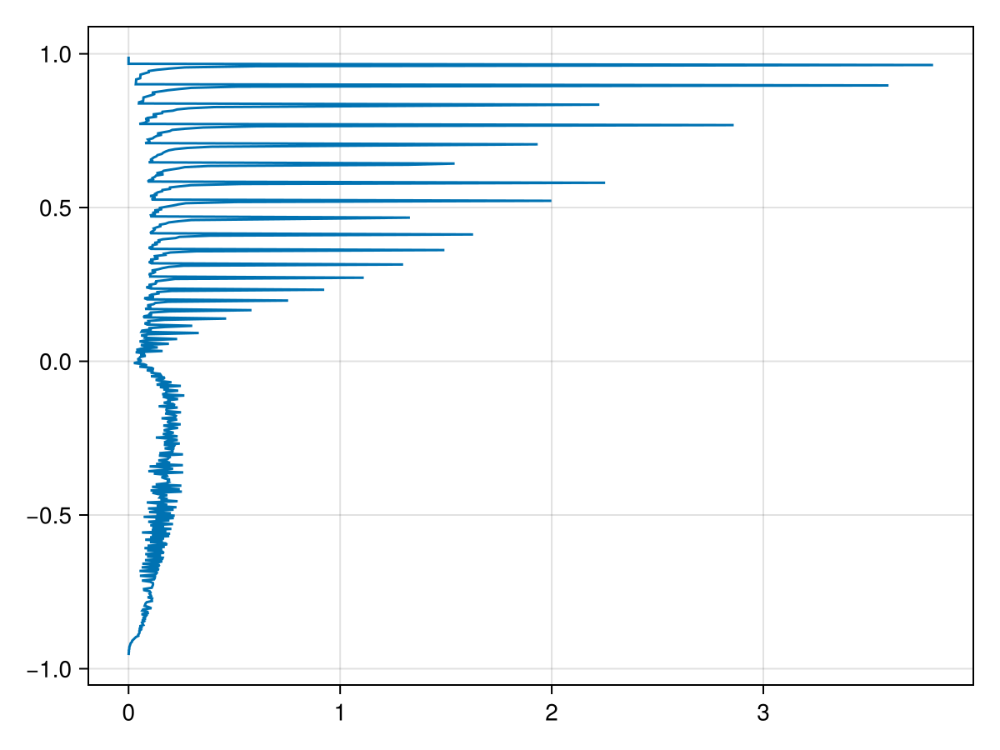

In [23]:
lines(Gmix, b_out)

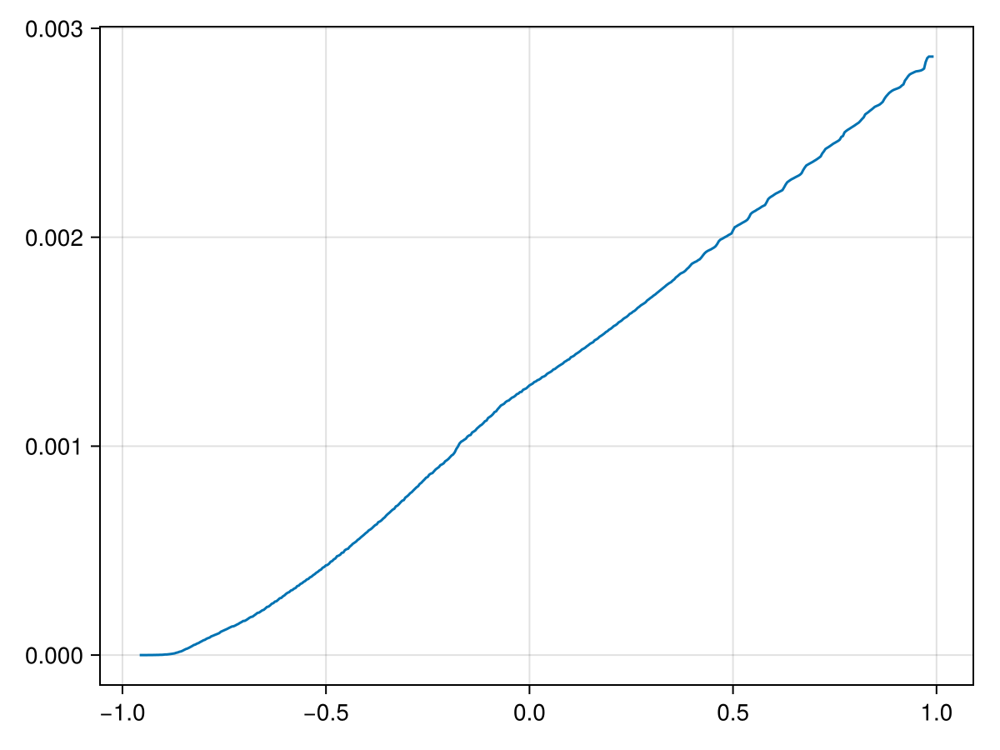

In [18]:
lines(b_uniform, F_binned)
lines(b_uniform, F_binned_last)

In [5]:
function compute_Gmix_sort(b, χ, ΔV; n_b_bins=500, b_range=nothing)

    # b_init = b[:, :, :, 1] #b at the first timestep
    # χ_init = b[:, :, :, 1] #chi at first timestep

    #reshape arrays
    N_cells = length(b)                      # works on a single time snapshot
    ΔV_flat = reshape(ΔV, N_cells)
    b_flat = reshape(b, N_cells)
    χ_flat = reshape(χ, N_cells)

    #sort everything by buoyancy value
    sort_idx = sortperm(b_flat)
    b_sort = b_flat[sort_idx]
    χdV_sort = χ_flat[sort_idx] .* ΔV_flat[sort_idx]

    #cumsum function of buoyancy, sampled at every cell's buoyancy
    F_sort  = cumsum(χdV_sort)

    #bin χdV onto uniform grid before cumsum
    b_min, b_max = b_range
    b_uniform = range(b_min, b_max; length=n_b_bins)
    Δb = step(b_uniform)

    #sum χ*dV in each buoyancy bin
    χdV_binned = zeros(Float64, n_b_bins)
    for i in 1:N_cells
        idx = searchsortedlast(b_uniform, b_flat[i])
        idx = clamp(idx, 1, n_b_bins)
        χdV_binned[idx] += χ_flat[i] * ΔV_flat[i]
    end

    χdV_cumb = cumsum(χdV_binned)

    #smooth F before differentiating
    #using gaussian smoother on F
    σ_smooth = max(3, n_b_bins ÷ 40)
    χdV_cumb_smooth = gaussian_smooth(χdV_cumb, σ_smooth)

    #derivative
    #g_mix = 0.5 * d^2F/db^2 = 0.5 * d(χdV_binned)/db
    dχdV_db = diff(χdV_cumb_smooth) ./ Δb #first derivative of binned χdV
    b_out = collect(b_uniform[1:end-1]) .+ Δb/2

    return b_out, 0.5 .* dχdV_db ./ Δb
end

compute_Gmix_sort (generic function with 1 method)

In [30]:
b_out, G_mix = compute_Gmix_sort(b[:, :, :, end], χ[:, :, :, end], ΔV; b_range)

(Float32[-0.9556654, -0.95175654, -0.94784766, -0.9439388, -0.9400299, -0.936121, -0.9322121, -0.92830324, -0.92439437, -0.9204855  …  0.9557768, 0.9596857, 0.96359456, 0.9675034, 0.9714123, 0.9753212, 0.9792301, 0.983139, 0.98704785, 0.9909567], [0.00837545004366438, 0.009361949325786748, 0.01043688658177579, 0.011639213180619917, 0.01293219129818865, 0.014399684749024718, 0.01598182927410138, 0.017706738698339344, 0.019631940452544197, 0.021680912085186656  …  0.12634842561596946, 0.12123831376919175, 0.11623652665784354, 0.11125539572747896, 0.10653217682701922, 0.101945176750938, 0.09748693291697501, 0.09319885588345918, 0.08906511773426593, 0.085095146602793])

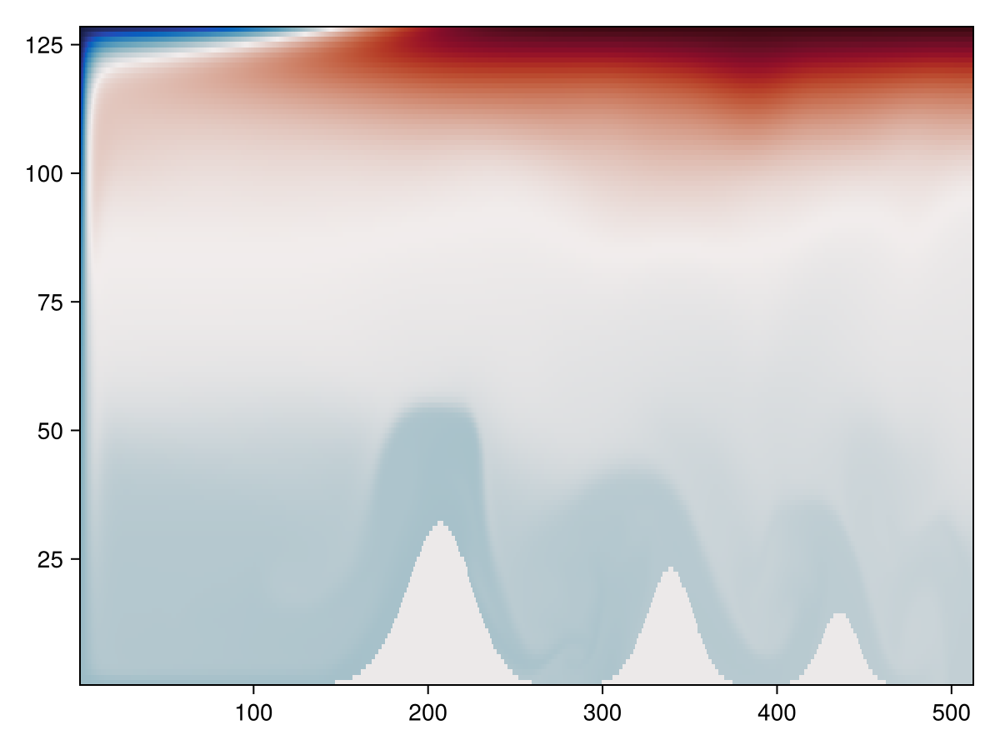

In [32]:
heatmap(b[:, 20, :, end], colormap=:balance)

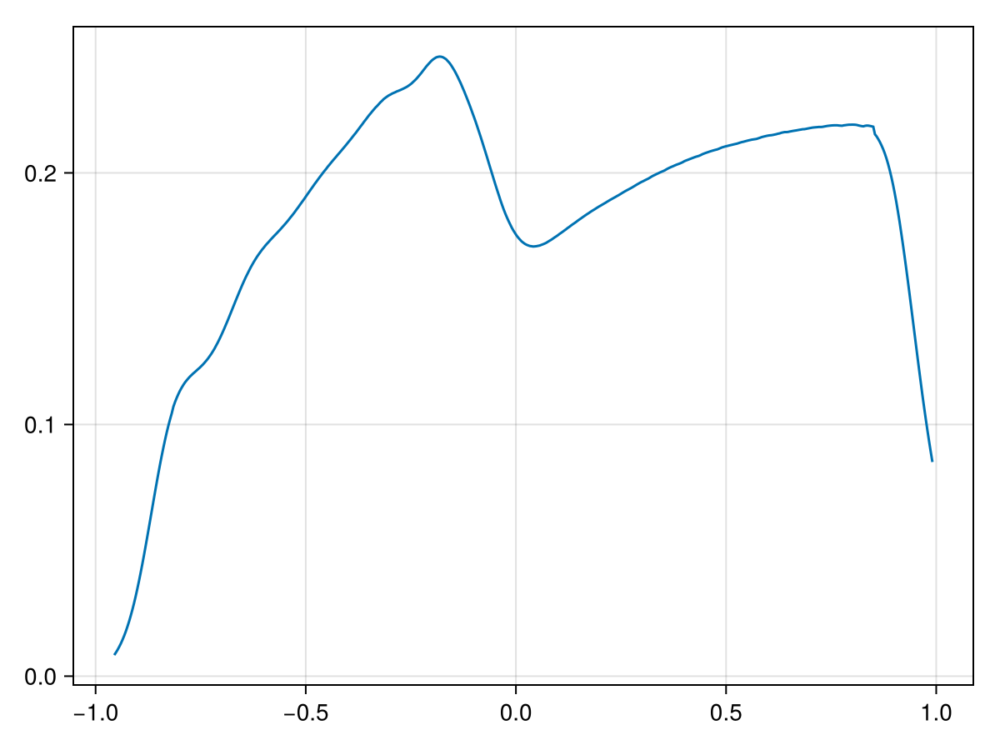

In [33]:
lines(b_out, G_mix)

this is the full g_mix which incorporates the laminar contribution of $\chi$ and the turbulent contribution
i need to separate these, by taking RANS of buoyancy and calculating g_mix_laminar and g_mix_turbulent from b_avg and b_prime

In [ ]:
Nt = size(b,4)
b_range = (minimum(b), maximum(b))

b_out = compute_Gmix_sort(b[:, :, :, 1], χ[:, :, :, 1], ΔV; b_range)[1] #b_out array at first time
G_mix_all = zeros(Float32, length(b_out), Nt)

for t in 1:Nt
    G_mix_all[:,t] = compute_Gmix_sort(b[:, :, :, t], χ[:, :, :, t], ΔV; b_range)[2]
end

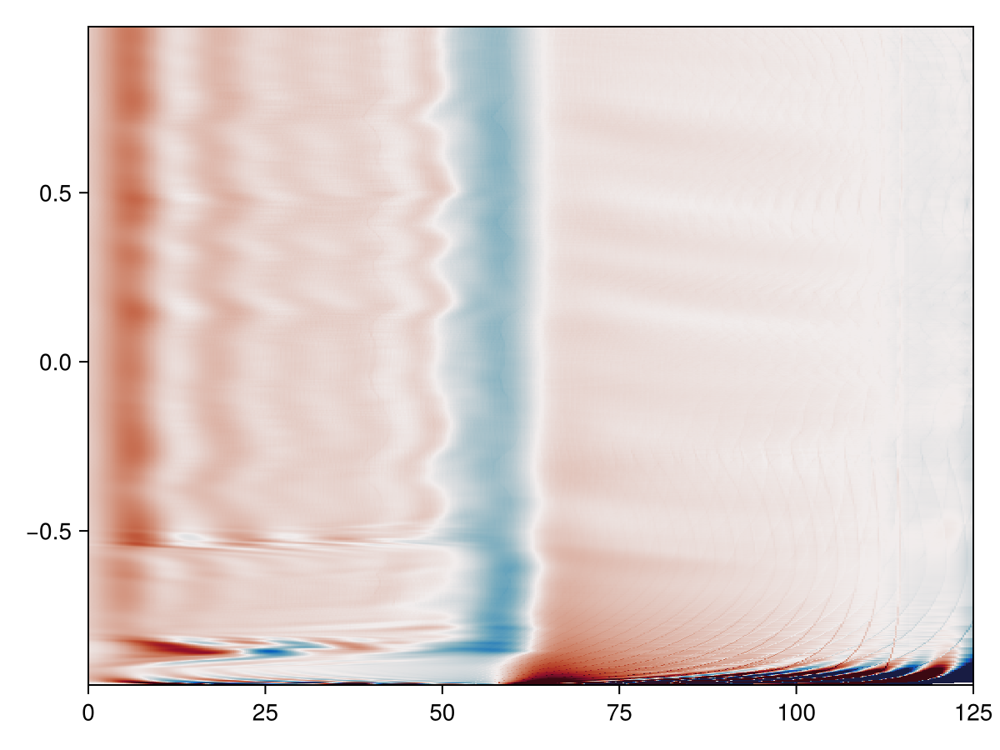

In [ ]:
heatmap(ds["time"][:], b_out, G_mix_all, colormap=:balance, colorrange=(-0.009, 0.009))

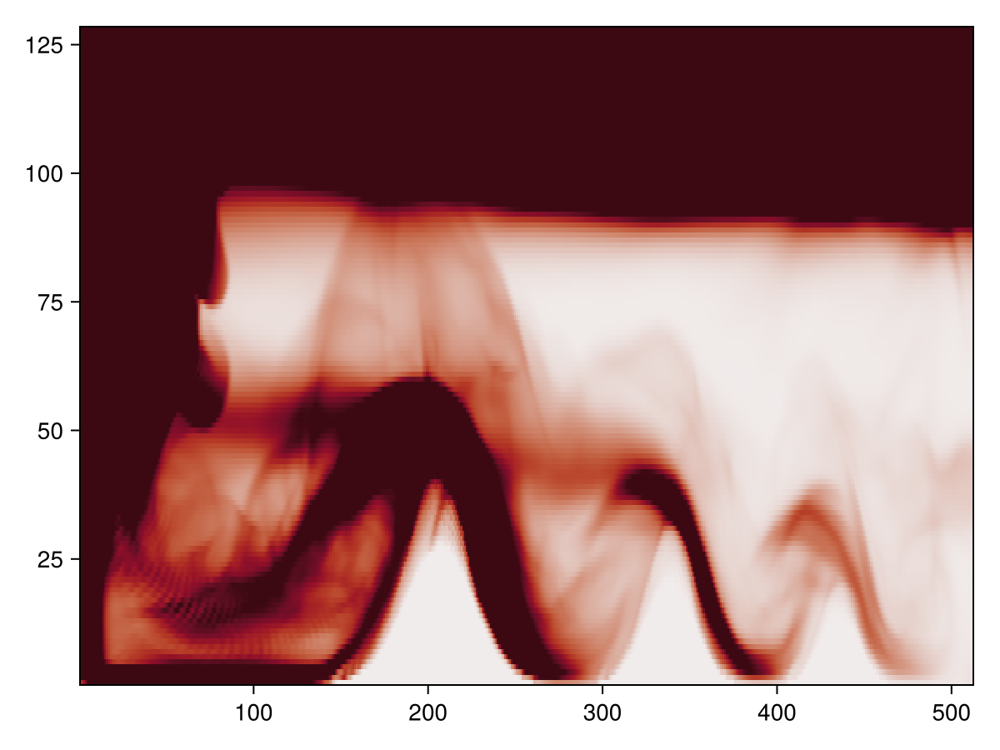

In [38]:
χ_xz = mean(χ, dims=(2,4))

heatmap(χ_xz[:, 1, :, 1], colormap=:balance, colorrange=(-1e-4, 1e-4))

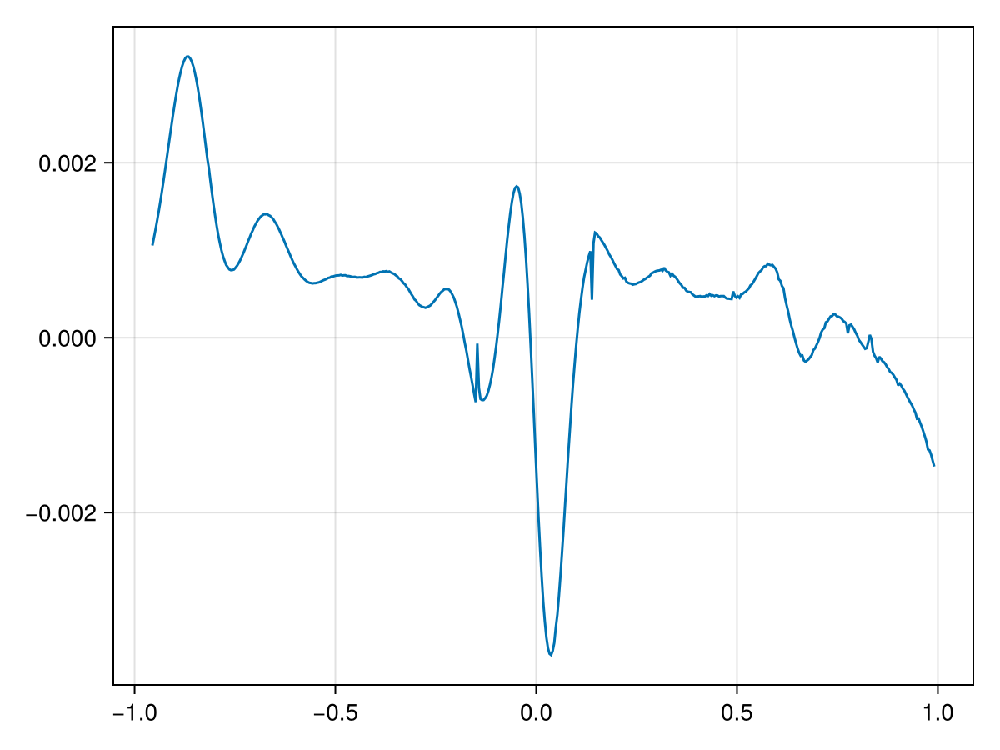

In [20]:
G_b = mean(G_mix_all, dims=2)

lines(b_out, G_b[:])

In [21]:
ds["time"][100]
b_out[244]

-0.0058076214f0

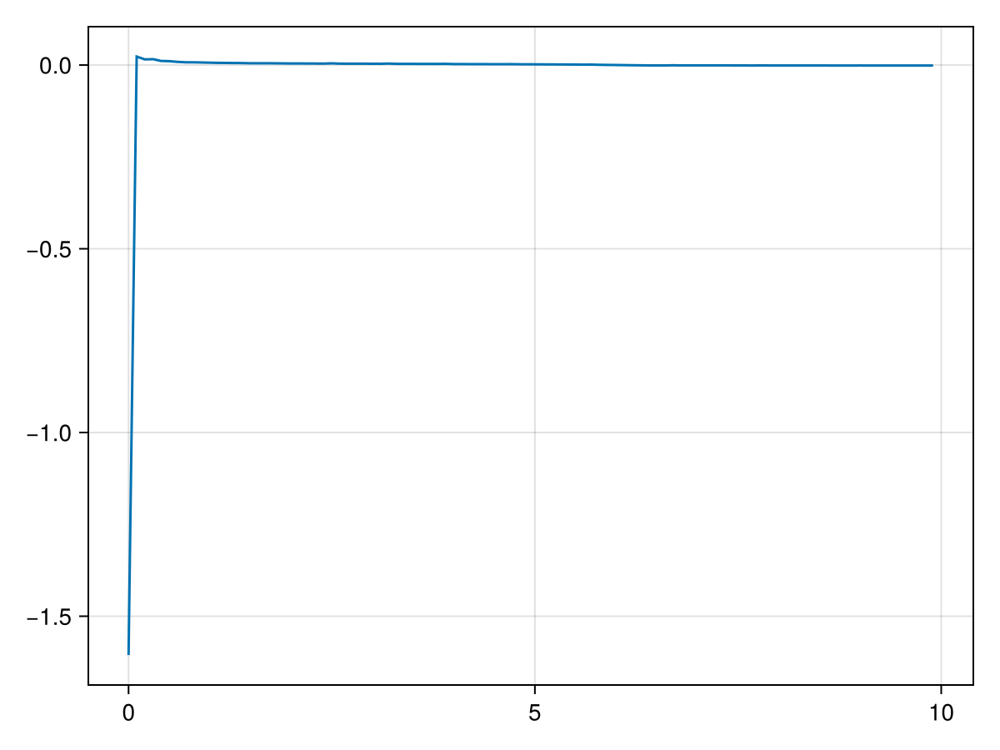

In [22]:
lines(ds["time"][1:100],G_mix_all[247,1:100])

In [77]:
x[90]

-1.6343777f0

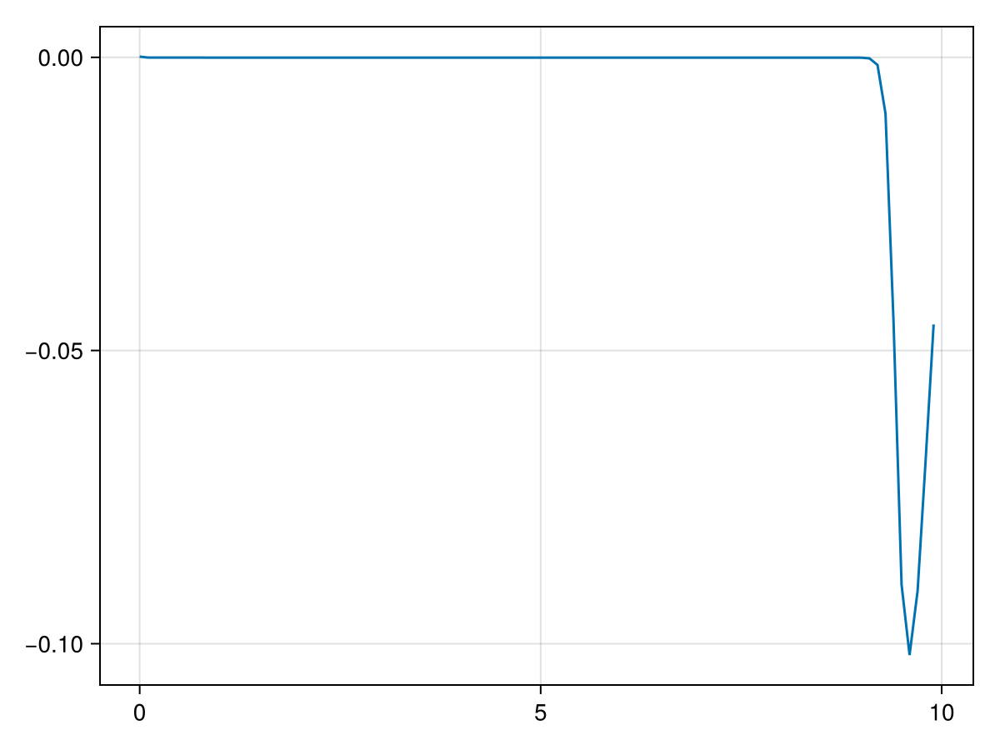

In [23]:
lines(ds["time"][1:100], b[20, 6, 10, 1:100])


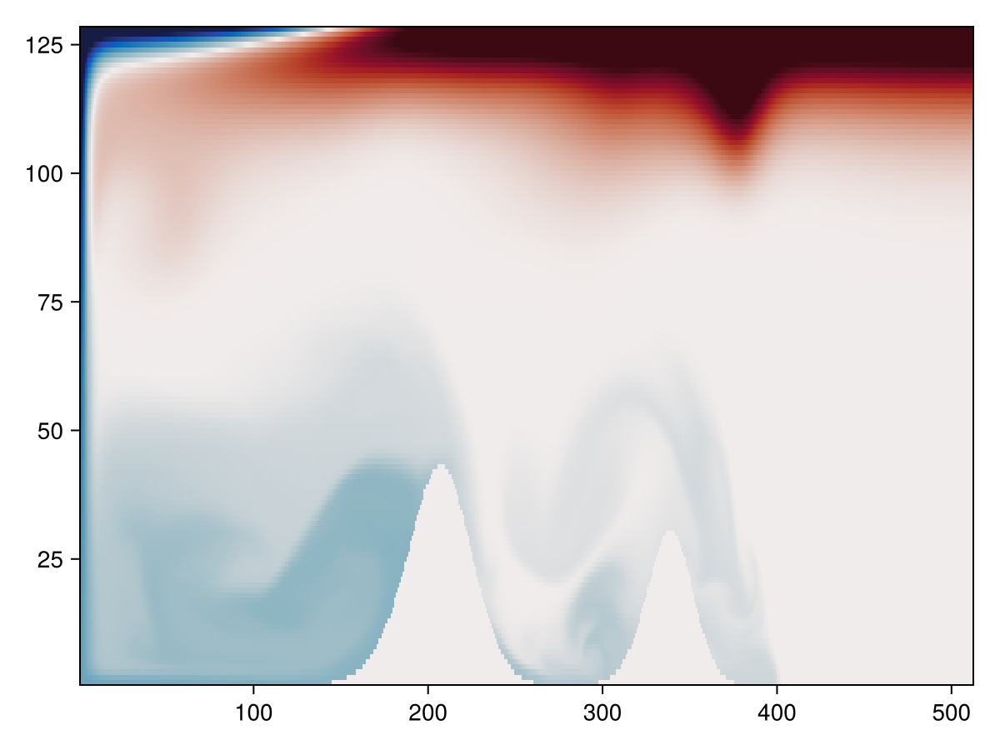

In [44]:
heatmap(b[:,6,:,400], colormap=:balance, colorrange=(-0.6, 0.6))